# Analyze data with Apache Spark
Apache Spark is an open source engine for distributed data processing, and is widely used to explore, process, and analyze huge volumes of data in data lake storage. Spark is available as a processing option in many data platform products, including Azure HDInsight, Azure Databricks, Azure Synapse Analytics, and Microsoft Fabric. One of the benefits of Spark is support for a wide range of programming languages, including Java, Scala, Python, and SQL; making Spark a very flexible solution for data processing workloads including data cleansing and manipulation, statistical analysis and machine learning, and data analytics and visualization.

# Create a workspace
Before working with data in Fabric, create a workspace with the Fabric trial enabled.

1. On the Microsoft Fabric home page at https://app.fabric.microsoft.com, select **Synapse Data Engineering**.
2. In the menu bar on the left, select **Workspaces** (the icon looks similar to 🗇).
3. Create a new workspace with a name of your choice, selecting a licensing mode in the **Advanced** section that includes Fabric capacity (Trial, Premium, or Fabric).
4. When your new workspace opens, it should be empty.

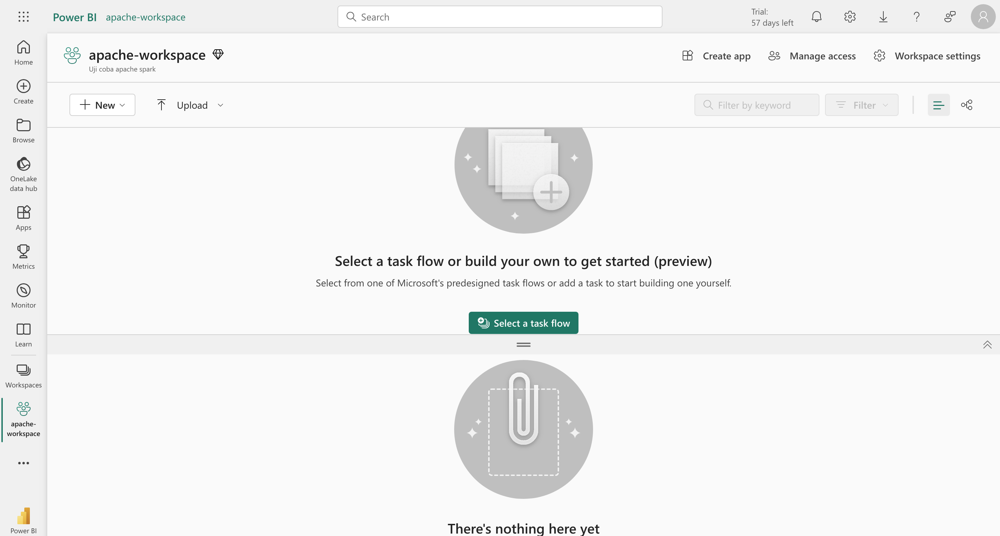   

# Create a lakehouse and upload files
Now that you have a workspace, it’s time to create a data lakehouse for the data files you’re going to analyze.

1. In the **Synapse Data Engineering** home page, create a new **Lakehouse** with a name of your choice.

After a minute or so, a new empty lakehouse will be created. You need to ingest some data into the data lakehouse for analysis. There are multiple ways to do this, but in this exercise you’ll simply download and extract a folder of text files your local computer (or lab VM if applicable) and then upload them to your lakehouse.
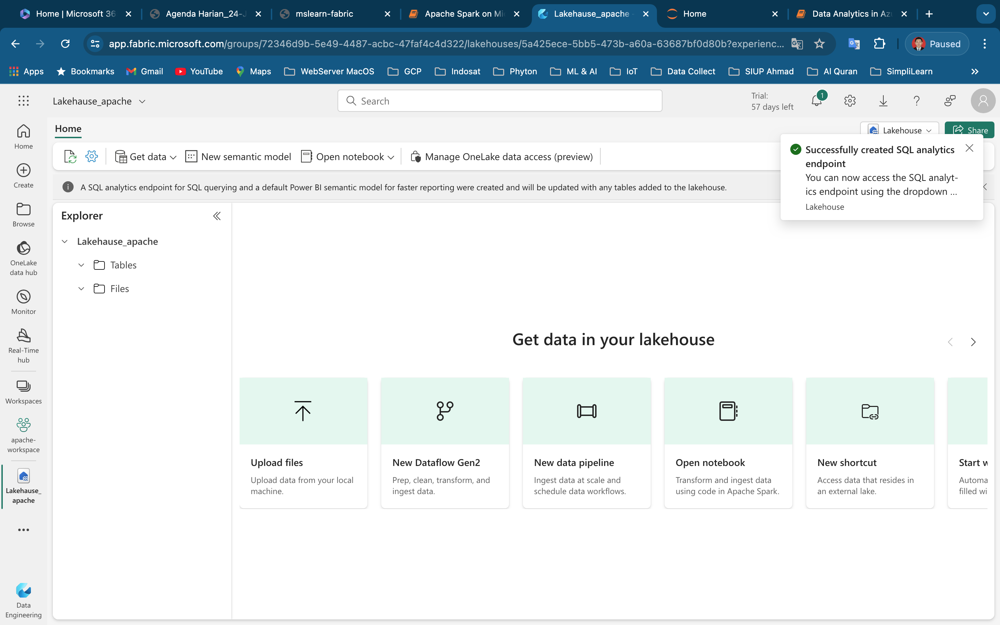

2. Download and extract the <a href="https://github.com/MicrosoftLearning/dp-data/raw/main/orders.zip">data files</a> for this exercise from https://github.com/MicrosoftLearning/dp-data/raw/main/orders.zip.

3. After extracting the zipped archive, verify that you have a folder named **orders** that contains CSV files named **2019.csv**, **2020.csv**, and **2021.csv**.
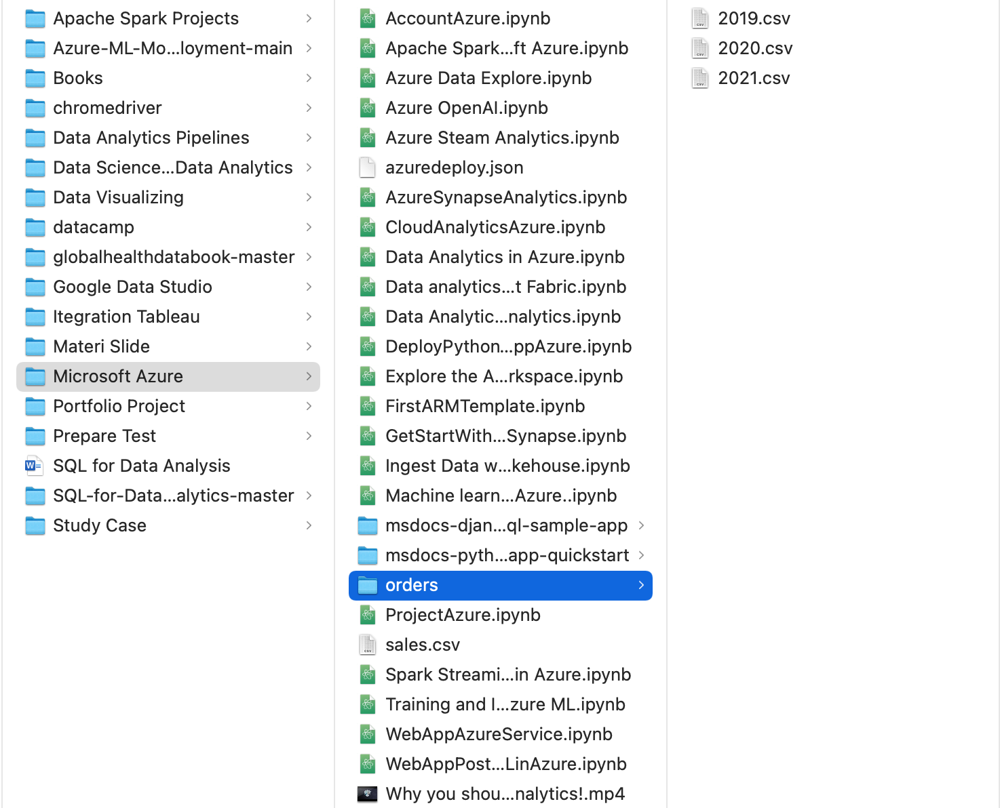

4. Return to the web browser tab containing your lakehouse, and in the … menu for the **Files** folder in the **Explorer** pane, select **Upload** and **Upload folder**, and then upload the **orders** folder from your local computer (or lab VM if applicable) to the lakehouse.
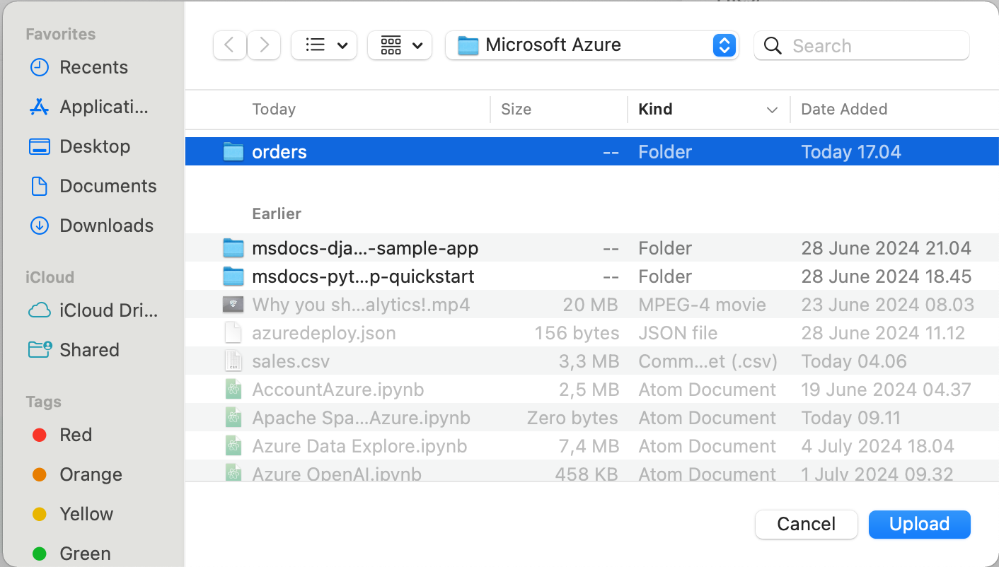

5. After the files have been uploaded, expand **Files** and select the orders folder; and verify that the CSV files have been uploaded, as shown here:

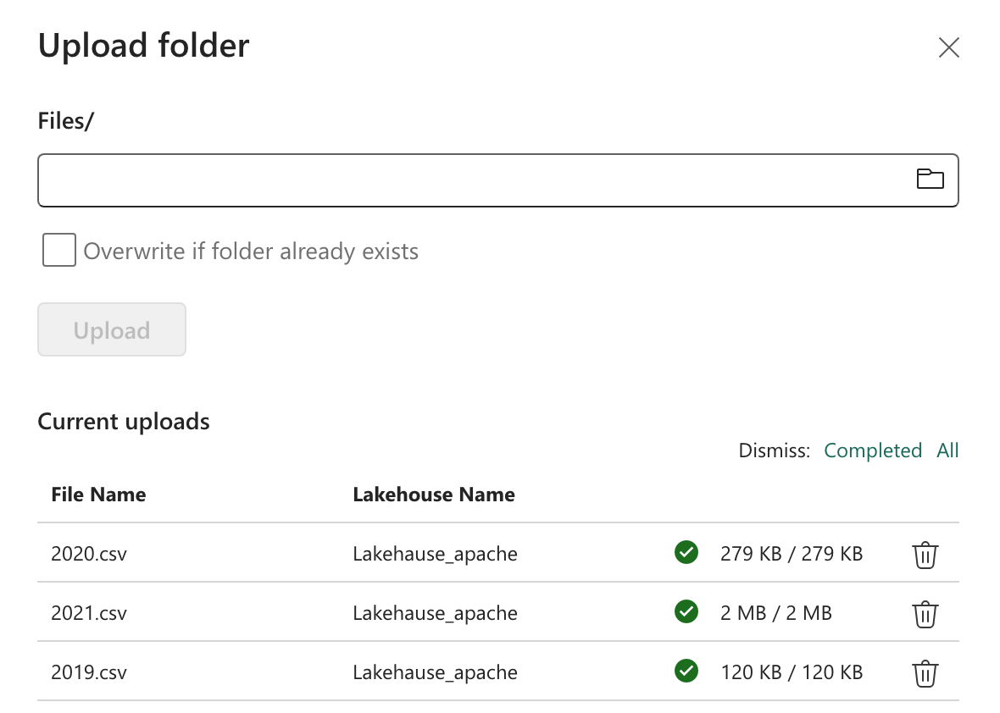

# Create a notebook
To work with data in Apache Spark, you can create a notebook. Notebooks provide an interactive environment in which you can write and run code (in multiple languages), and add notes to document it.

1. On the **Home** page while viewing the contents of the **orders** folder in your datalake, in the **Open notebook** menu, select **New notebook**.
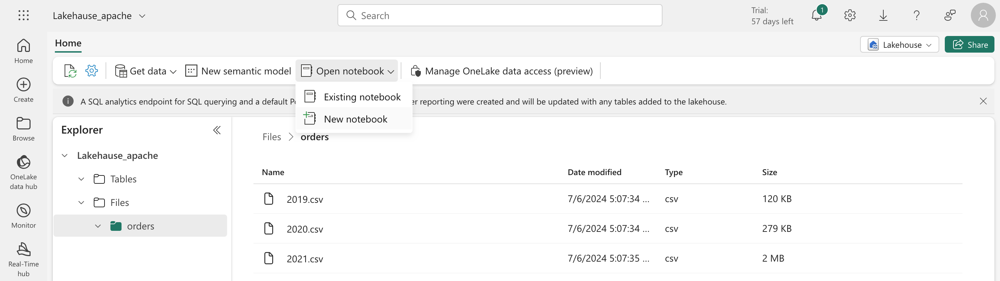
After a few seconds, a new notebook containing a single cell will open. Notebooks are made up of one or more cells that can contain code or markdown (formatted text).
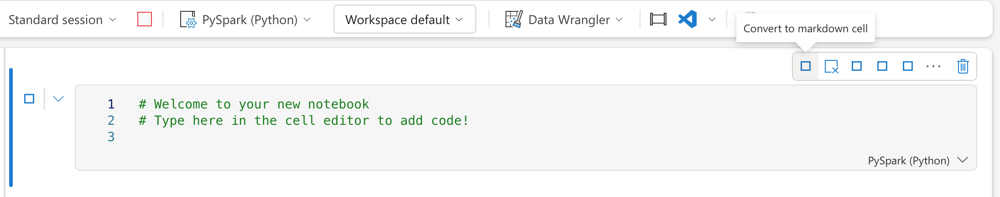
2. Select the first cell (which is currently a code cell), and then in the dynamic tool bar at its top-right, use the **M↓** button to convert the cell to a markdown cell.

When the cell changes to a markdown cell, the text it contains is rendered.
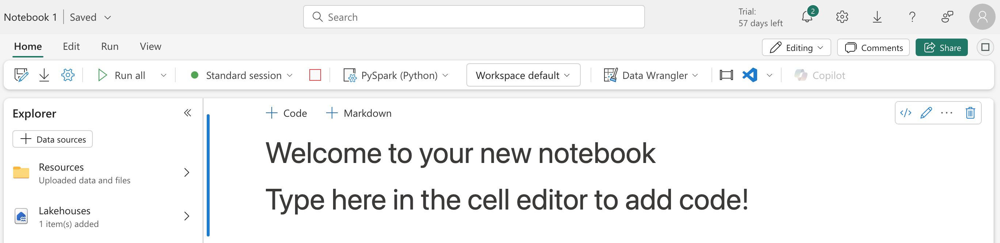
3. Use the 🖉 (Edit) button to switch the cell to editing mode, then modify the markdown as follows:


4. Click anywhere in the notebook outside of the cell to stop editing it and see the rendered markdown.
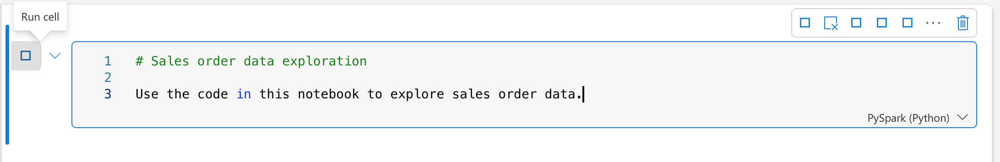

# Load data into a dataframe
Now you’re ready to run code that loads the data into a dataframe. Dataframes in Spark are similar to Pandas dataframes in Python, and provide a common structure for working with data in rows and columns.

> Note: Spark supports multiple coding languages, including Scala, Java, and others. In this exercise, we’ll use PySpark, which is a Spark-optimized variant of Python. PySpark is one of the most commonly used languages on Spark and is the default language in Fabric notebooks.

1. With the notebook visible, in the **Explorer** pane, expand **Lakehouses** and then expand the **Files** list for your lakehouse and select the **orders** folder so that the CSV files are listed next to the notebook editor, like this:

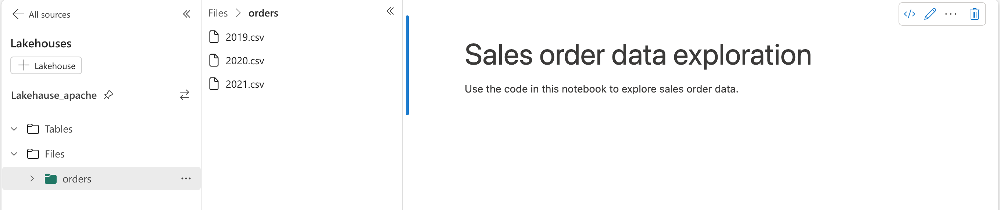   

2. In the … menu for **2019.csv**, select **Load data** > **Spark**. A new code cell containing the following code should be added to the notebook:

> Tip: You can hide the Lakehouse explorer panes on the left by using their « icons. Doing so will help you focus on the notebook.

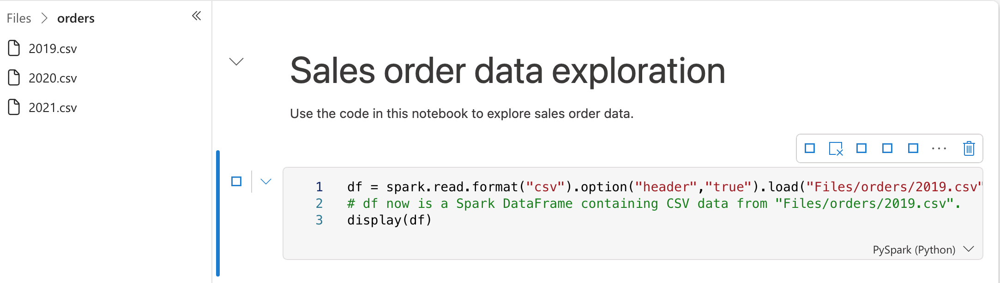
3. Use the ▷ **Run cell** button on the left of the cell to run it.

> Note: Since this is the first time you’ve run any Spark code, a Spark session must be started. This means that the first run in the session can take a minute or so to complete. Subsequent runs will be quicker.

4. When the cell command has completed, review the output below the cell, which should look similar to this:

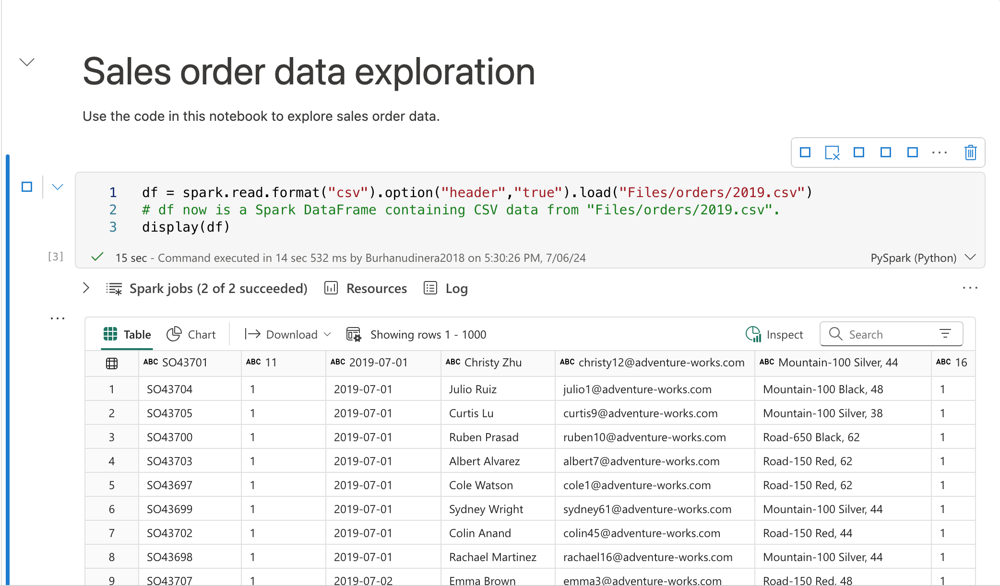   

The output shows the rows and columns of data from the 2019.csv file. However, note that the column headers don’t look right. The default code used to load the data into a dataframe assumes that the CSV file includes the column names in the first row, but in this case the CSV file just includes the data with no header information.

5. Modify the code to set the **header** option to **false** as follows:
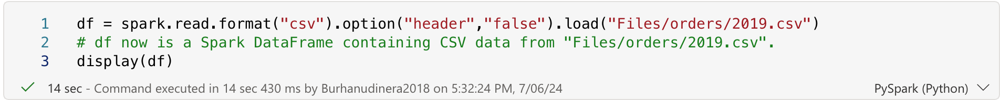

6. Re-run the cell and review the output, which should look similar to this:
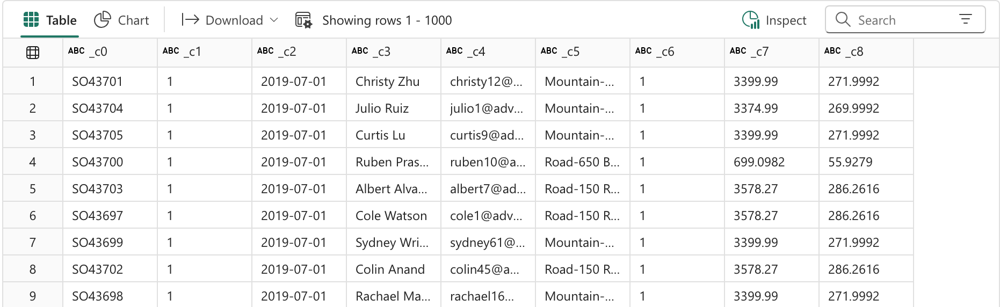


Now the dataframe correctly includes first row as data values, but the column names are auto-generated and not very helpful. To make sense of the data, you need to explicitly define the correct schema and data type for the data values in the file.

7. Modify the code as follows to define a schema and apply it when loading the data:


8. Run the modified cell and review the output, which should look similar to this:
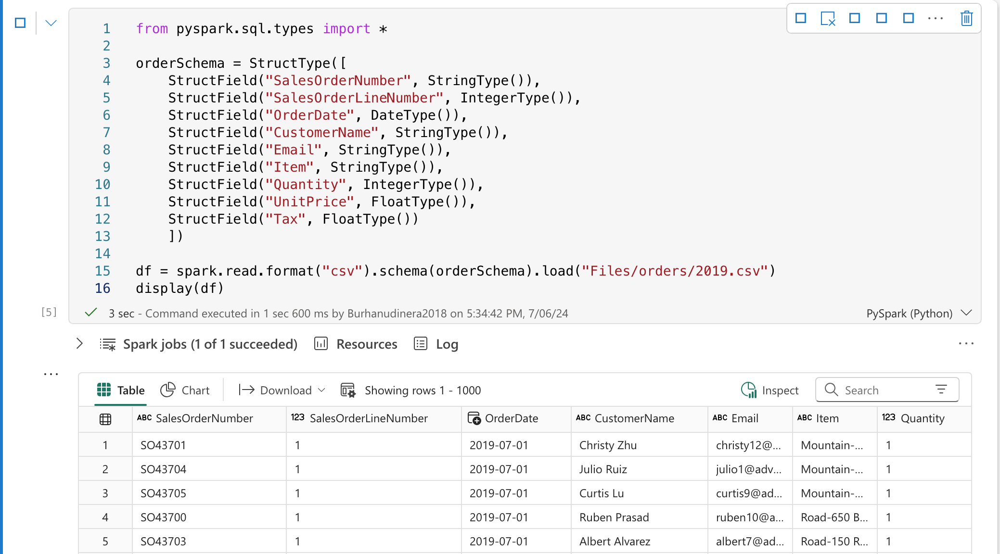
Now the dataframe includes the correct column names (in addition to the **Index**, which is a built-in column in all dataframes based on the ordinal position of each row). The data types of the columns are specified using a standard set of types defined in the Spark SQL library, which were imported at the beginning of the cell.

9. The dataframe includes only the data from the **2019.csv** file. Modify the code so that the file path uses a * wildcard to read the sales order data from all of the files in the **orders** folder:

10. Run the modified code cell and review the output, which should now include sales for 2019, 2020, and 2021.
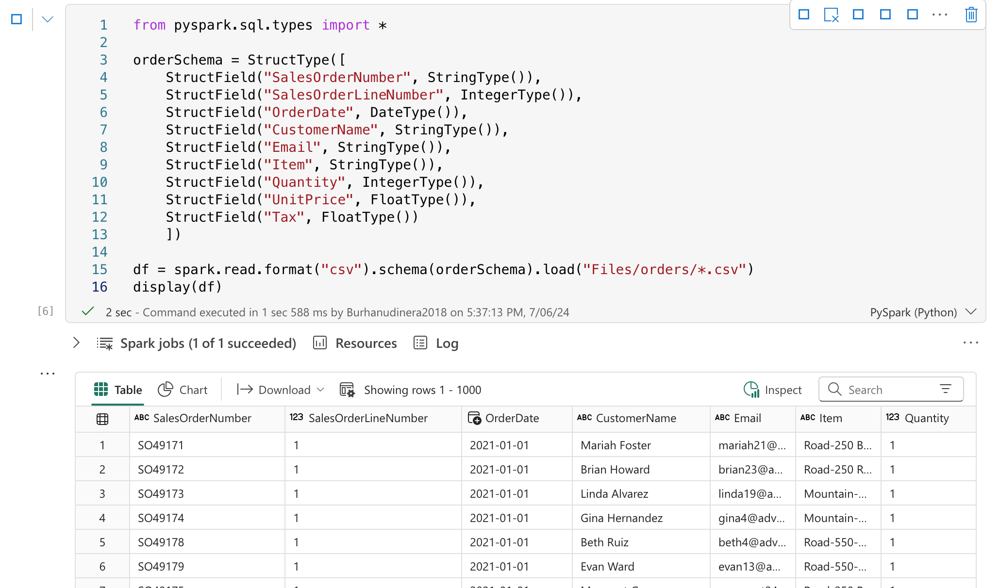

Note: Only a subset of the rows is displayed, so you may not be able to see examples from all years.

# Explore data in a dataframe
The dataframe object includes a wide range of functions that you can use to filter, group, and otherwise manipulate the data it contains.

Filter a dataframe
1. Add a new code cell by using the **+ Code** link that appears when you move the mouse under the left side of the current cell’s output (or on the menu bar, on the **Edit** tab, select **+ Add code cell**). Then enter the following code in it.

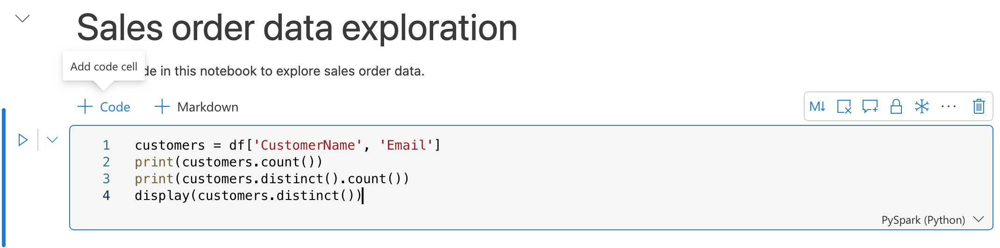

2. Run the new code cell, and review the results. Observe the following details:
    + When you perform an operation on a dataframe, the result is a new dataframe (in this case, a new customers dataframe is created by selecting a specific subset of columns from the df dataframe)
    + Dataframes provide functions such as count and distinct that can be used to summarize and filter the data they contain.
    The `dataframe['Field1', 'Field2', ...]` syntax is a shorthand way of defining a subset of columns. You can also use select method, so the first line of the code above could be written as `customers = df.select("CustomerName", "Email")`
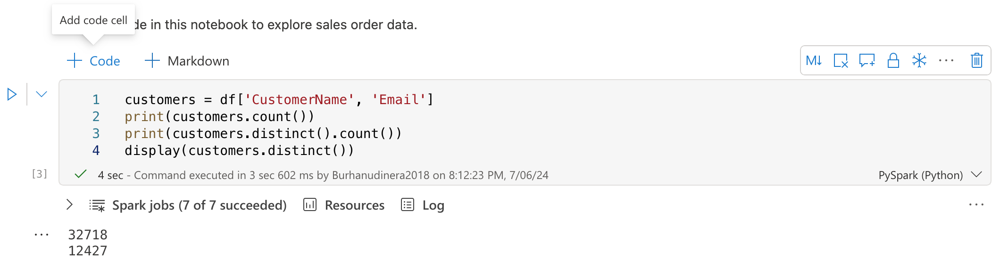


3. Modify the code as follows:

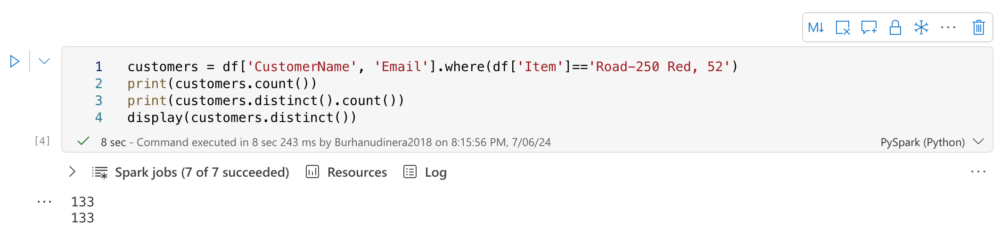
4. Run the modified code to view the customers who have purchased the Road-250 Red, 52 product. Note that you can “chain” multiple functions together so that the output of one function becomes the input for the next - in this case, the dataframe created by the select method is the source dataframe for the where method that is used to apply filtering criteria.
## Aggregate and group data in a dataframe
1. Add a new code cell to the notebook, and enter the following code in it:


2. Run the code cell you added, and note that the results show the sum of order quantities grouped by product. The **groupBy** method groups the rows by Item, and the subsequent sum aggregate function is applied to all of the remaining numeric columns (in this case, Quantity)
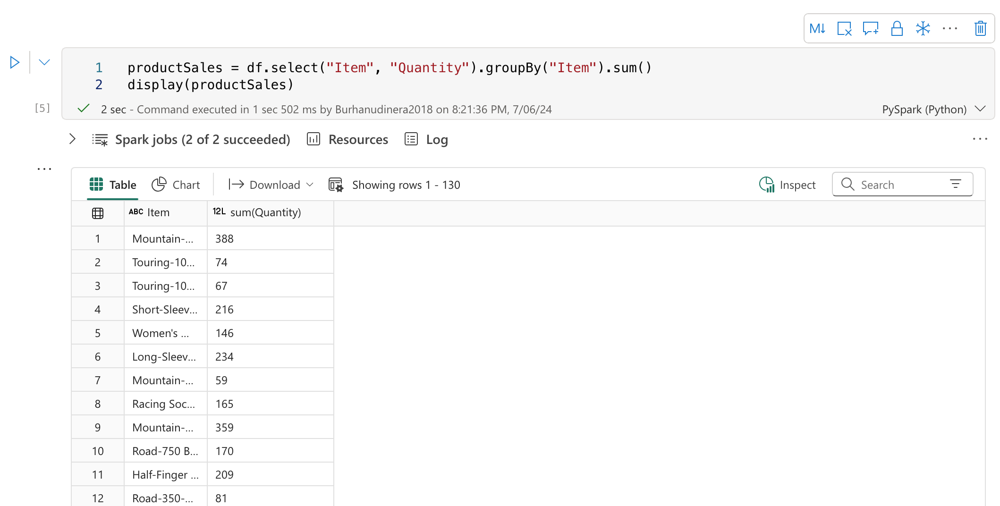
3. Add another new code cell to the notebook, and enter the following code in it:

4. Run the code cell you added, and note that the results show the number of sales orders per year. Note that the **select** method includes a SQL **year** function to extract the year component of the OrderDate field (which is why the code includes an **import** statement to import functions from the Spark SQL library). It then uses an **alias** method to assign a column name to the extracted year value. The data is then grouped by the derived Year column and the count of rows in each group is calculated before finally the **orderBy** method is used to sort the resulting dataframe.
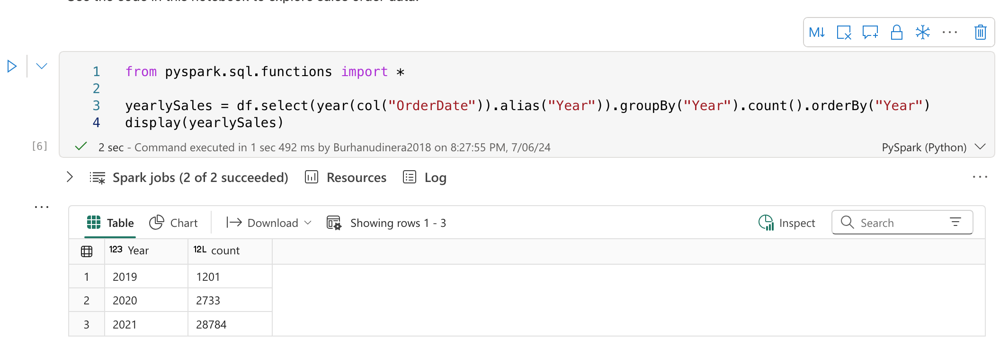
# Use Spark to transform data files
A common task for data engineers is to ingest data in a particular format or structure, and transform it for further downstream processing or analysis.

Use dataframe methods and functions to transform data
1. Add another new code cell to the notebook, and enter the following code in it:

2. Run the code to create a new dataframe from the original order data with the following transformations:
+ Add Year and Month columns based on the OrderDate column.
+ Add FirstName and LastName columns based on the CustomerName column.
+ Filter and reorder the columns, removing the CustomerName column.
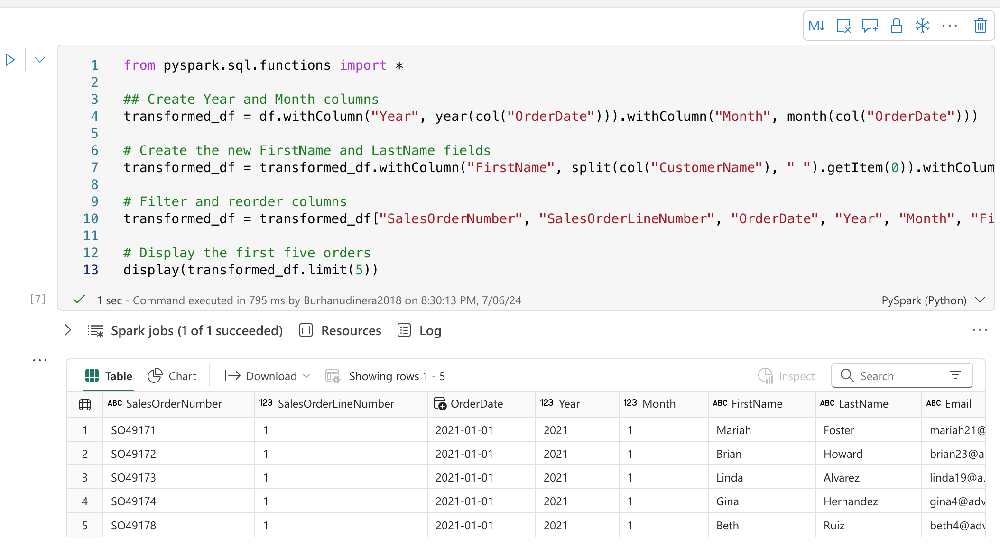

3. Review the output and verify that the transformations have been made to the data.

You can use the full power of the Spark SQL library to transform the data by filtering rows, deriving, removing, renaming columns, and applying any other required data modifications.

> Tip: See the Spark dataframe documentation to learn more about the methods of the Dataframe object.

## Save the transformed data
1. Add a new cell with the following code to save the transformed dataframe in Parquet format (Overwriting the data if it already exists):

> Note: Commonly, Parquet format is preferred for data files that you will use for further analysis or ingestion into an analytical store. Parquet is a very efficient format that is supported by most large scale data analytics systems. In fact, sometimes your data transformation requirement may simply be to convert data from another format (such as CSV) to Parquet!
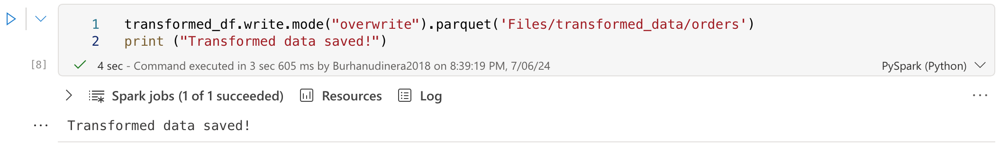
2. Run the cell and wait for the message that the data has been saved. Then, in the **Lakehouses** pane on the left, in the … menu for the **Files** node, select **Refresh**; and select the **transformed_data** folder to verify that it contains a new folder named **orders**, which in turn contains one or more Parquet files.
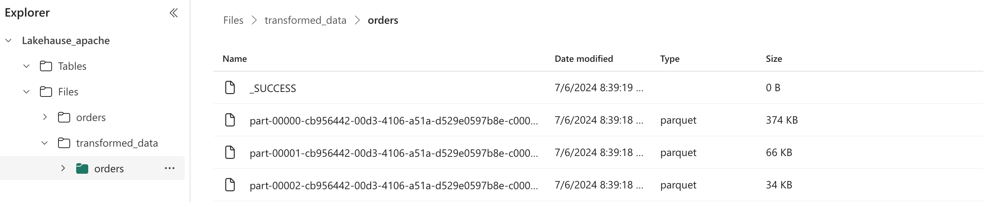

3. Add a new cell with the following code to load a new dataframe from the parquet files in the **transformed_data/orders** folder:

4. Run the cell and verify that the results show the order data that has been loaded from the parquet files.
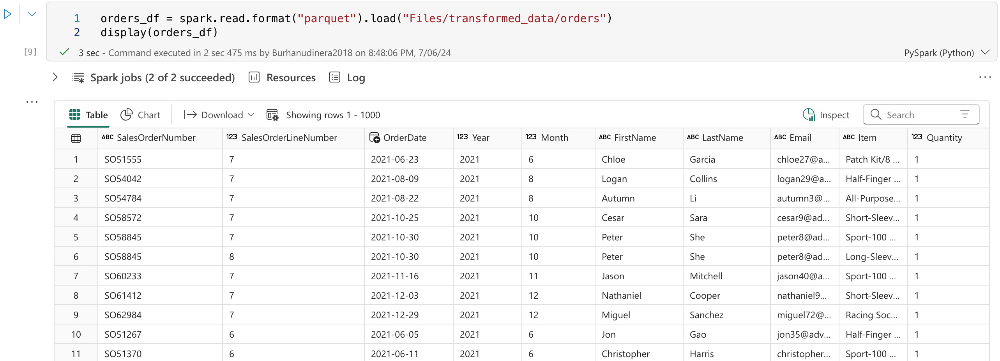
## Save data in partitioned files
1. Add a new cell with the following code; which saves the dataframe, partitioning the data by **Year** and **Month**:


2. Run the cell and wait for the message that the data has been saved. Then, in the **Lakehouses** pane on the left, in the … menu for the **Files** node, select **Refresh**; and expand the **partitioned_orders** folder to verify that it contains a hierarchy of folders named **Year=xxxx**, each containing folders named **Month=xxxx**. Each month folder contains a parquet file with the orders for that month.

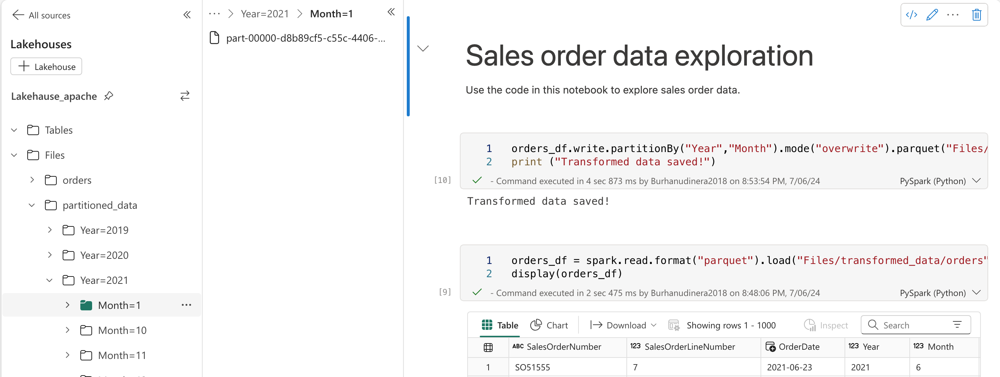
Partitioning data files is a common way to optimize performance when dealing with large volumes of data. This technique can significantly improve performance and make it easier to filter data.

3. Add a new cell with the following code to load a new dataframe from the **orders.parquet** file:

4. Run the cell and verify that the results show the order data for sales in 2021. Note that the partitioning columns specified in the path (**Year** and **Month**) are not included in the dataframe.
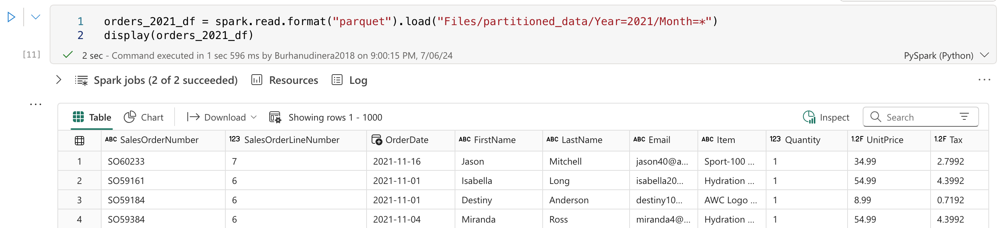
# Work with tables and SQL
As you’ve seen, the native methods of the dataframe object enable you to query and analyze data from a file quite effectively. However, many data analysts are more comfortable working with tables that they can query using SQL syntax. Spark provides a metastore in which you can define relational tables. The Spark SQL library that provides the dataframe object also supports the use of SQL statements to query tables in the metastore. By using these capabilities of Spark, you can combine the flexibility of a data lake with the structured data schema and SQL-based queries of a relational data warehouse - hence the term “data lakehouse”.

## Create a table
Tables in a Spark metastore are relational abstractions over files in the data lake. tables can be managed (in which case the files are managed by the metastore) or external (in which case the table references a file location in the data lake that you manage independently of the metastore).

1. Add a new code cell to the notebook, and enter the following code, which saves the dataframe of sales order data as a table named **salesorders**:

> Note: It’s worth noting a couple of things about this example. Firstly, no explicit path is provided, so the files for the table will be managed by the metastore. Secondly, the table is saved in delta format. You can create tables based on multiple file formats (including CSV, Parquet, Avro, and others) but delta lake is a Spark technology that adds relational database capabilities to tables; including support for transactions, row versioning, and other useful features. Creating tables in delta format is preferred for data lakehouses in Fabric.

2. Run the code cell and review the output, which describes the definition of the new table.
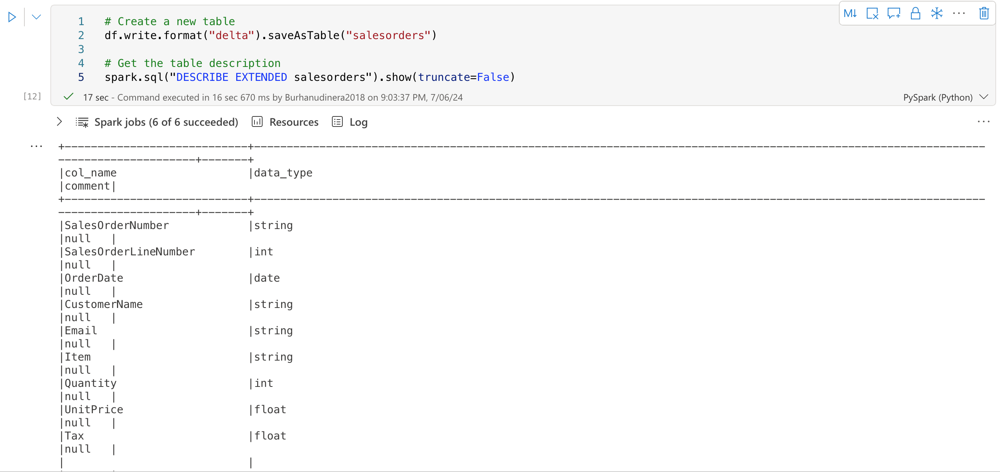
3. In the **Lakehouses** pane, in the … menu for the **Tables** folder, select **Refresh**. Then expand the **Tables** node and verify that the **salesorders** table has been created.
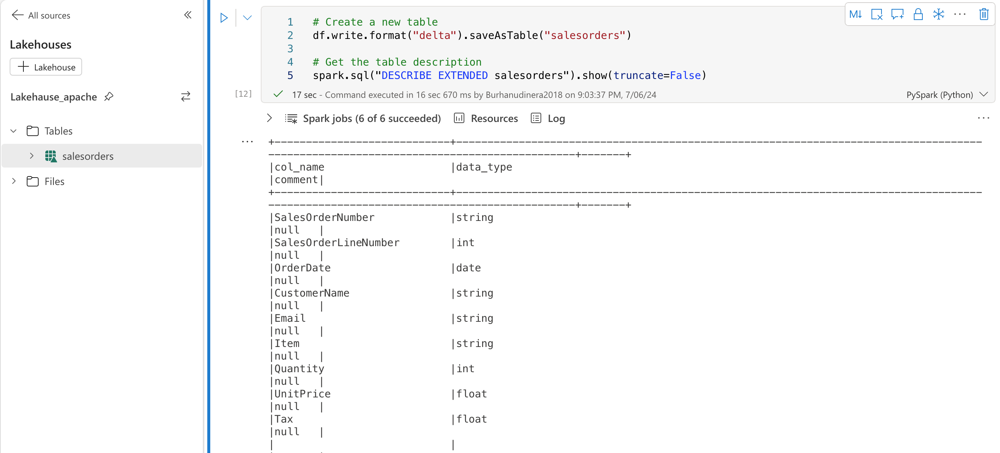
4. In the … menu for the **salesorders** table, select **Load data > Spark**.

A new code cell containing code similar to the following example is added to the notebook:

5. Run the new code, which uses the Spark SQL library to embed a SQL query against the salesorder table in PySpark code and load the results of the query into a dataframe.
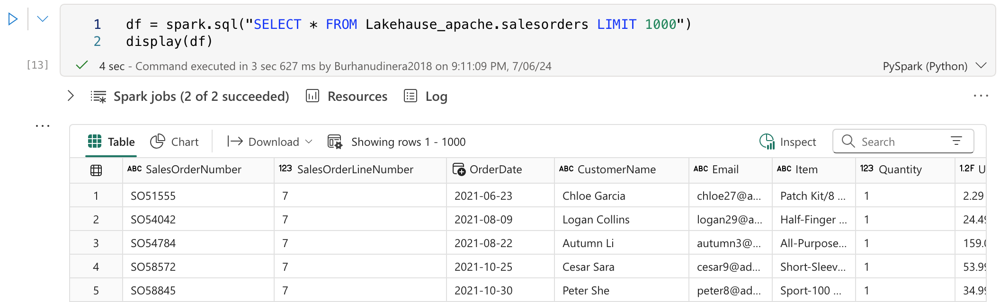
## Run SQL code in a cell
While it’s useful to be able to embed SQL statements into a cell containing PySpark code, data analysts often just want to work directly in SQL.

1. Add a new code cell to the notebook, and enter the following code in it:

2. Run the cell and review the results. Observe that:

+ The `%%sql` line at the beginning of the cell (called a magic) indicates that the Spark SQL language runtime should be used to run the code in this cell instead of PySpark.
+ The SQL code references the **salesorders** table that you created previously.
+ The output from the SQL query is automatically displayed as the result under the cell.
> Note: For more information about Spark SQL and dataframes, see the Spark SQL documentation.
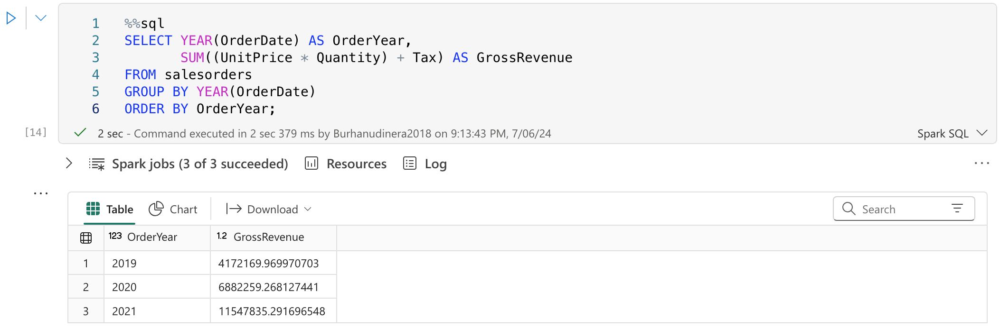
# Visualize data with Spark
A picture is proverbially worth a thousand words, and a chart is often better than a thousand rows of data. While notebooks in Fabric include a built in chart view for data that is displayed from a dataframe or Spark SQL query, it is not designed for comprehensive charting. However, you can use Python graphics libraries like matplotlib and seaborn to create charts from data in dataframes.

## View results as a chart
1. Add a new code cell to the notebook, and enter the following code in it:

2. Run the code and observe that it returns the data from the salesorders view you created previously.
3. In the results section beneath the cell, change the View option from Table to Chart.
4. Use the Customize chart button at the top right of the chart to display the options pane for the chart. Then set the options as follows and select Apply:
    + Chart type: Bar chart
    + Key: Item
    + Values: Quantity
    + Series Group: leave blank
    + Aggregation: Sum
    + Stacked: Unselected
5. Verify that the chart looks similar to this:
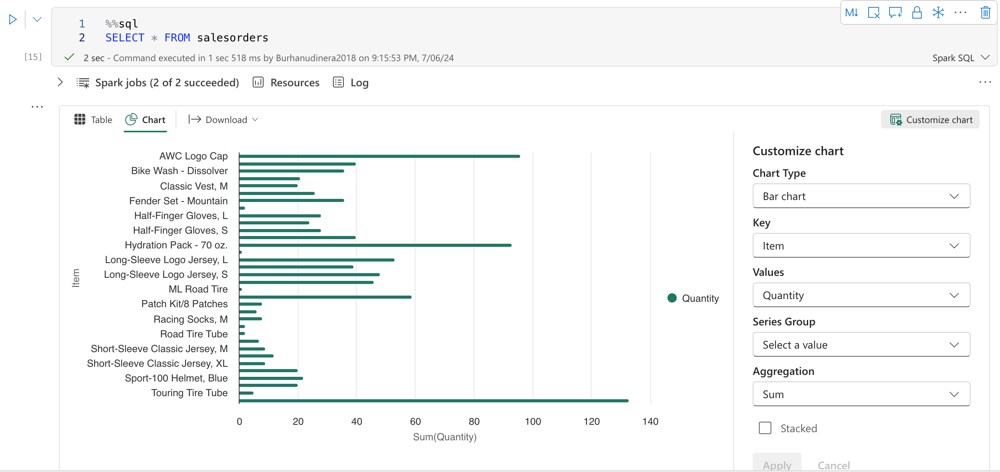

## Get started with matplotlib
1. Add a new code cell to the notebook, and enter the following code in it:

2. Run the code and observe that it returns a Spark dataframe containing the yearly revenue.
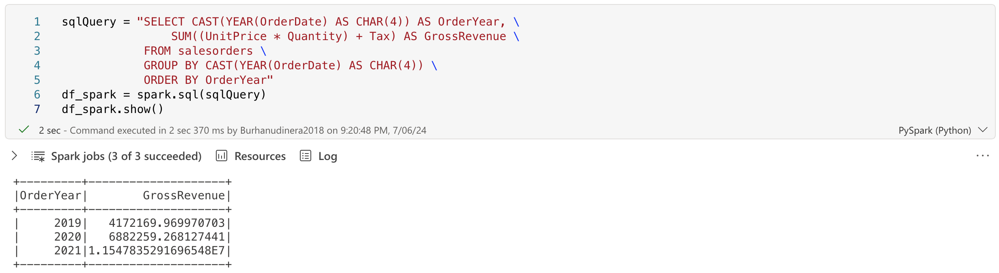
To visualize the data as a chart, we’ll start by using the **matplotlib** Python library. This library is the core plotting library on which many others are based, and provides a great deal of flexibility in creating charts.

3. Add a new code cell to the notebook, and add the following code to it:


4. Run the cell and review the results, which consist of a column chart with the total gross revenue for each year. Note the following features of the code used to produce this chart:
+ The **matplotlib** library requires a Pandas dataframe, so you need to convert the Spark dataframe returned by the Spark SQL query to this format.
+ At the core of the **matplotlib** library is the **pyplot** object. This is the foundation for most plotting functionality.
The default settings result in a usable chart, but there’s considerable scope to customize it
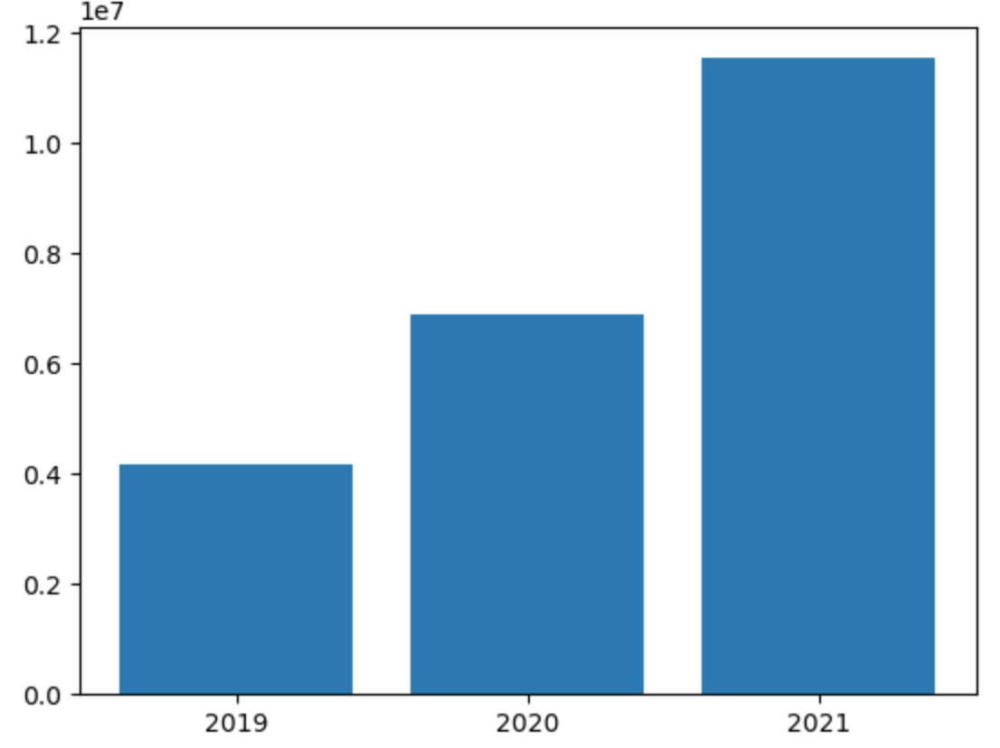
5. Modify the code to plot the chart as follows:

6. Re-run the code cell and view the results. The chart now includes a little more information.

A plot is technically contained with a **Figure**. In the previous examples, the figure was created implicitly for you; but you can create it explicitly.
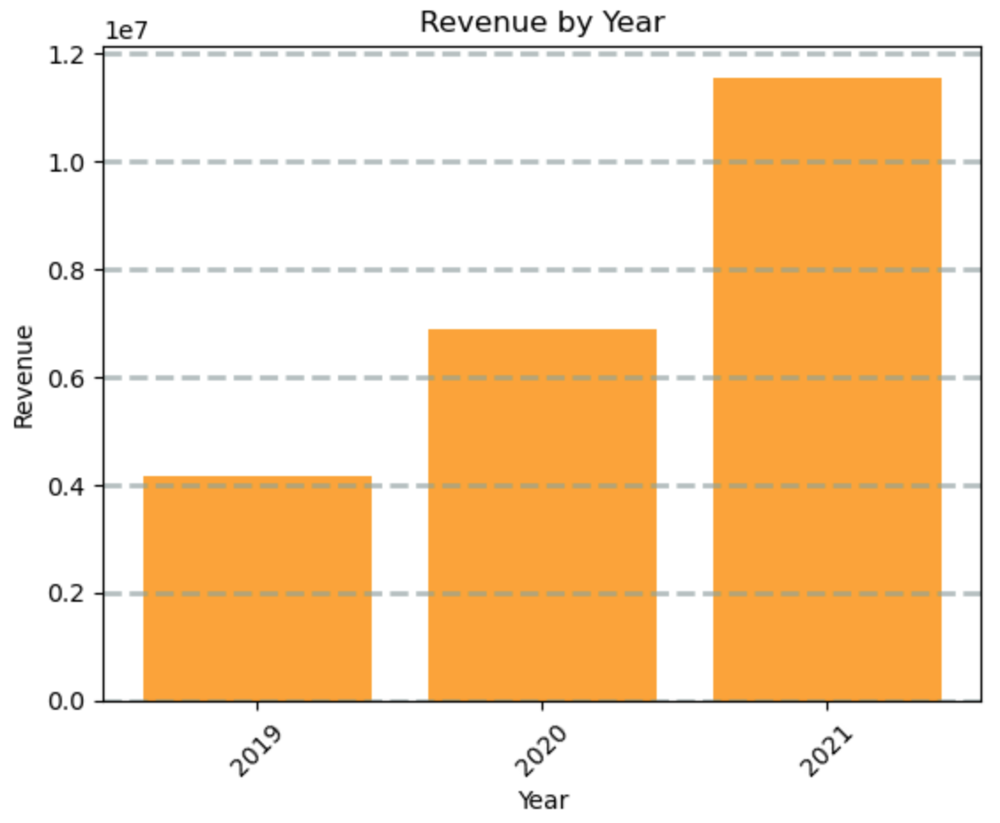
7. Modify the code to plot the chart as follows:

8. Re-run the code cell and view the results. The figure determines the shape and size of the plot.

A figure can contain multiple subplots, each on its own axis.
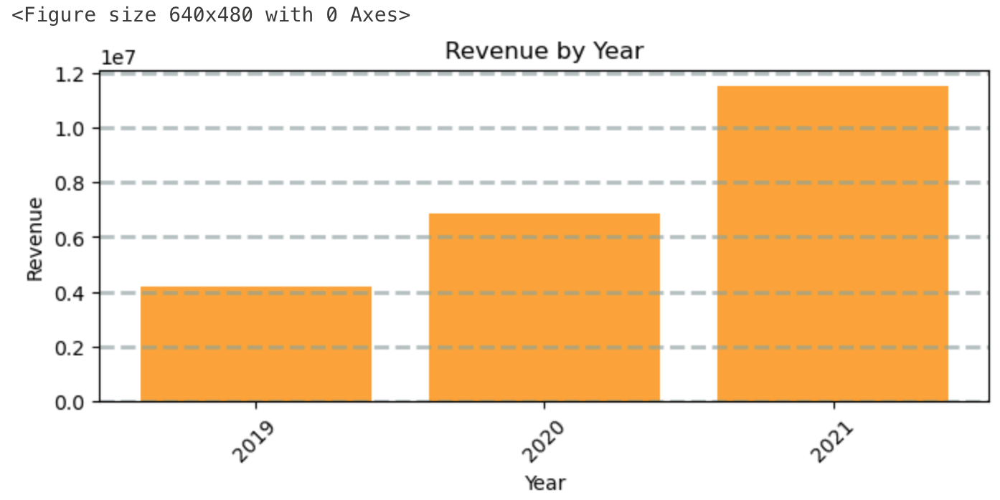
9. Modify the code to plot the chart as follows:

10. Re-run the code cell and view the results. The figure contains the subplots specified in the code.
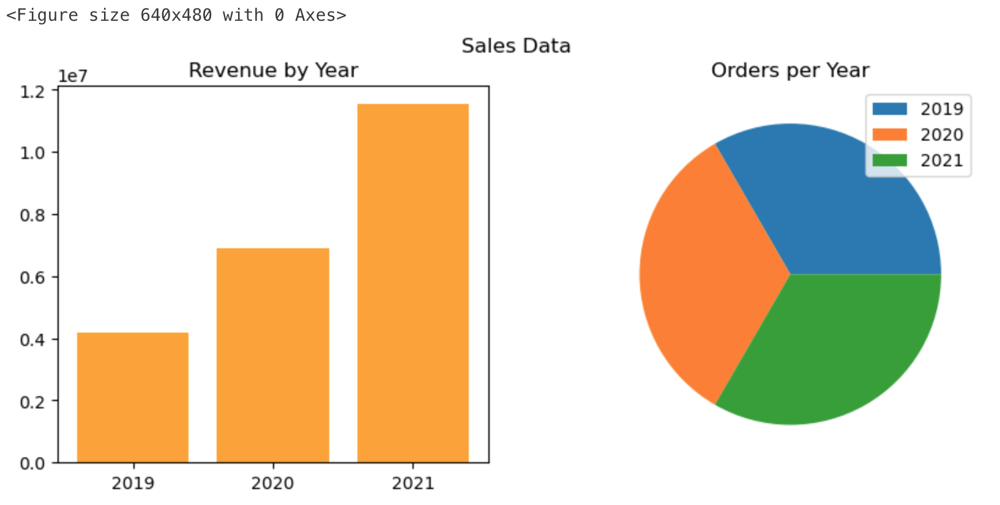
> Note: To learn more about plotting with matplotlib, see the matplotlib documentation.

## Use the seaborn library
While **matplotlib** enables you to create complex charts of multiple types, it can require some complex code to achieve the best results. For this reason, over the years, many new libraries have been built on the base of matplotlib to abstract its complexity and enhance its capabilities. One such library is **seaborn**.

1. Add a new code cell to the notebook, and enter the following code in it:

2. Run the code and observe that it displays a bar chart using the seaborn library.
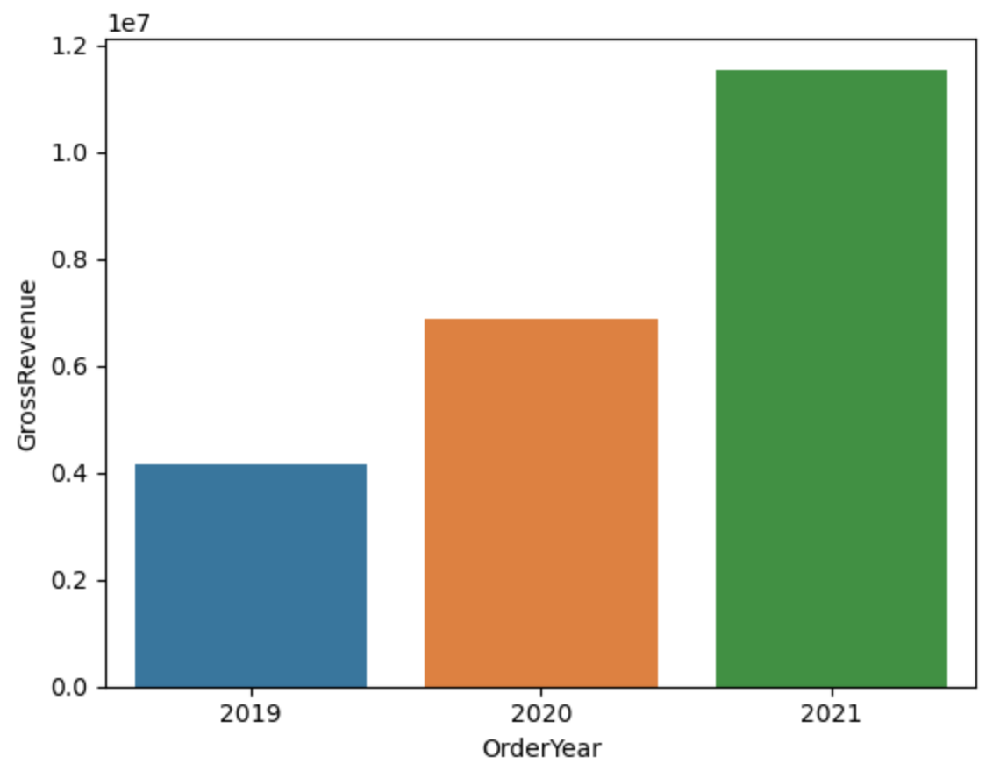
3. Modify the code as follows:

4. Run the modified code and note that seaborn enables you to set a consistent color theme for your plots.
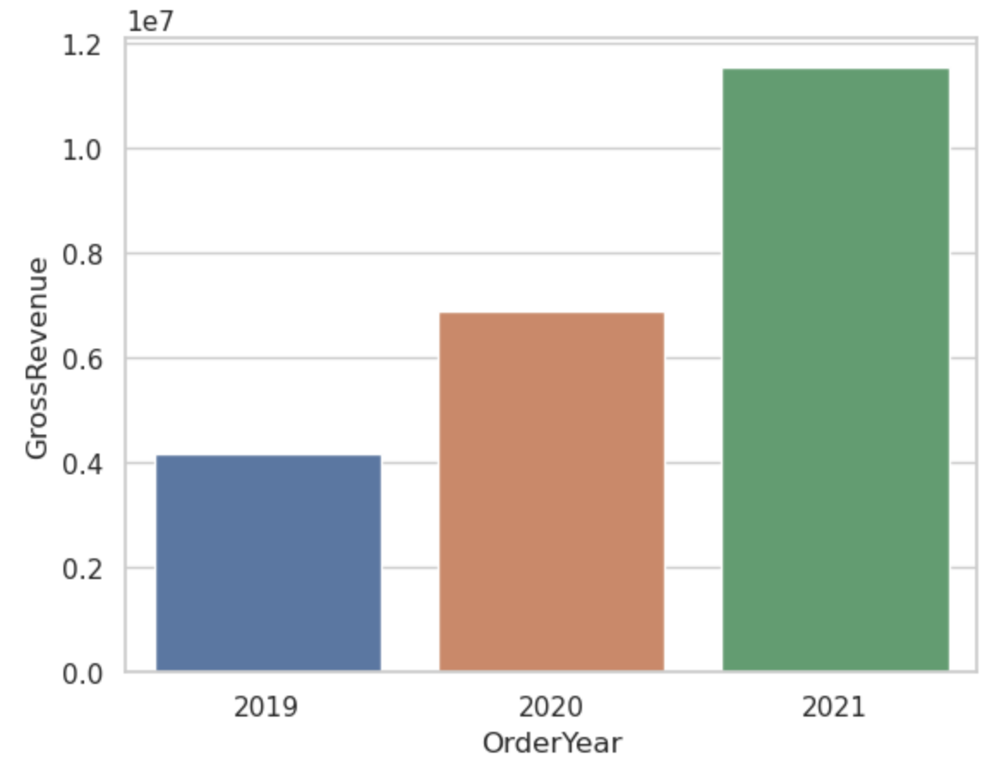
5. Modify the code again as follows:

6. Run the modified code to view the yearly revenue as a line chart.
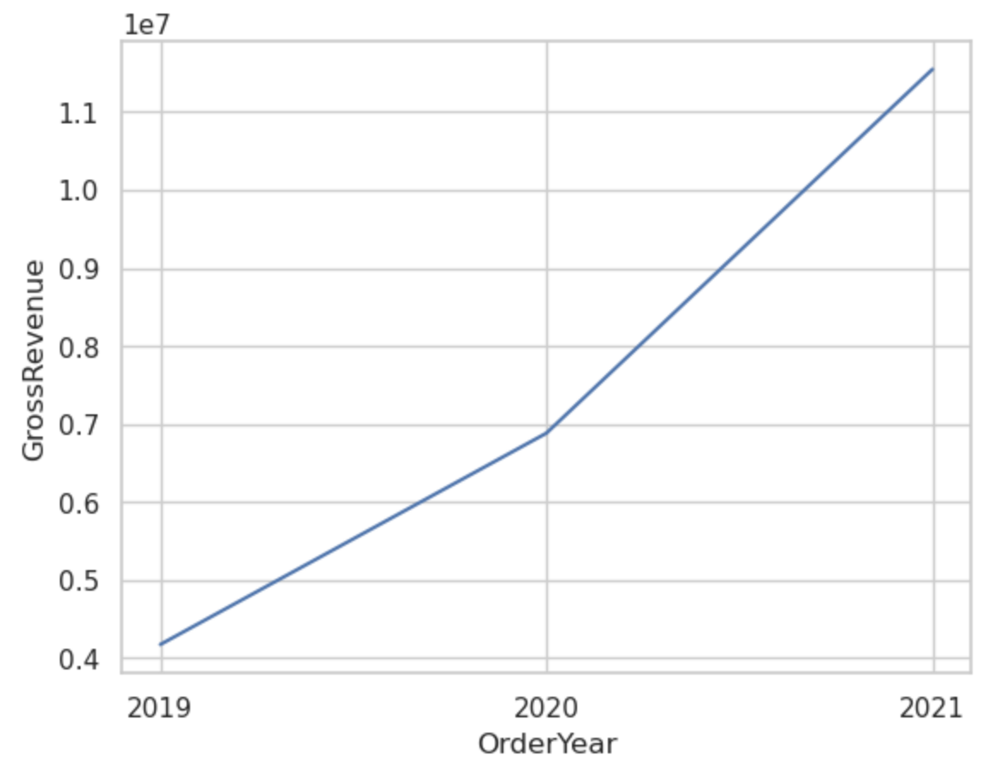
> Note: To learn more about plotting with seaborn, see the seaborn documentation.

# Save the notebook and end the Spark session
Now that you’ve finished working with the data, you can save the notebook with a meaningful name and end the Spark session.

1. In the notebook menu bar, use the ⚙️ **Settings** icon to view the notebook settings.
2. Set the **Name** of the notebook to **Explore Sales Orders**, and then close the settings pane.
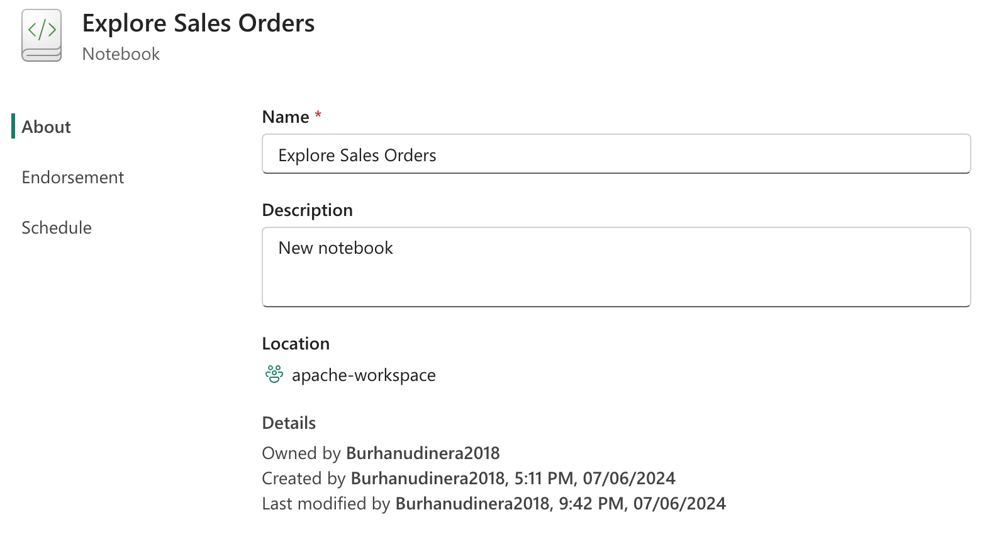
3. On the notebook menu, select **Stop session** to end the Spark session.

# Clean up resources
In this exercise, you’ve learned how to use Spark to work with data in Microsoft Fabric.

If you’ve finished exploring your lakehouse, you can delete the workspace you created for this exercise.

In the bar on the left, select the icon for your workspace to view all of the items it contains.
In the … menu on the toolbar, select **Workspace settings**.
In the General section, select **Remove this workspace**.